## Exploration of dataset

In [1]:
import numpy as np
import pandas as pd
import dask.array as da
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from IPython.display import HTML
import sys
import os

In [2]:
from visualize import snapshot, snapshot_anima

In [ ]:
data_dir = "../data"

### Methane concentration

In [6]:
dataset = xr.open_dataset("../data/resample/total_column_methane.nc")
dataset['tc_ch4'].max(), dataset['tc_ch4'].min()

(<xarray.DataArray 'tc_ch4' ()> Size: 8B
 array(0.01071432),
 <xarray.DataArray 'tc_ch4' ()> Size: 8B
 array(0.00494961))

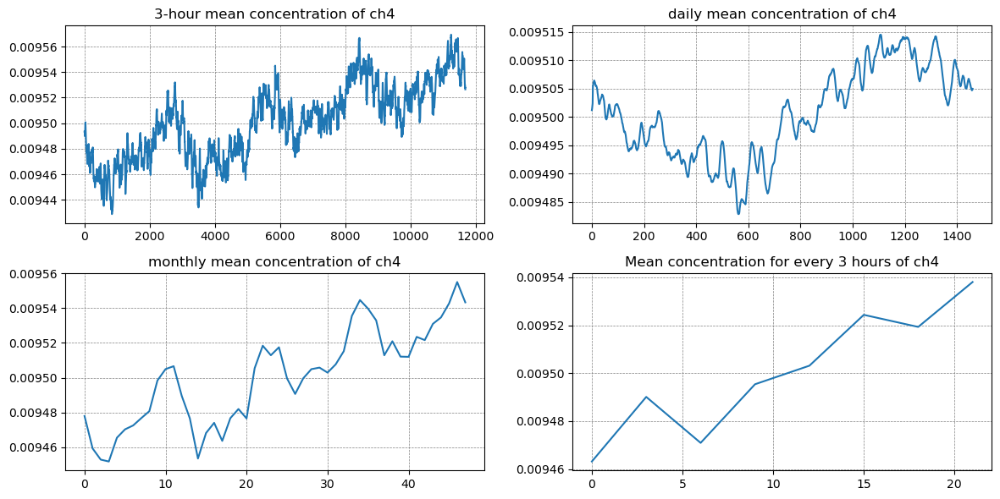

In [3]:
ds_gt = xr.open_dataset("../data/resample/total_column_methane.nc")
ds_mean = ds_gt['tc_ch4'].values.mean(axis=(1,2))
fig, axes = plt.subplots(2, 2, figsize=(12,6))
axes = axes.ravel()
axes[0].plot(ds_mean)
axes[0].grid(color="gray", linestyle="--", linewidth=0.5)
axes[0].set_title("3-hour mean concentration of ch4")
ds_day = ds_mean.reshape(8,-1).mean(axis=0)
axes[1].plot(ds_day)
axes[1].grid(color="gray", linestyle="--", linewidth=0.5)
axes[1].set_title("daily mean concentration of ch4")
ds_mon = ds_gt['tc_ch4'].resample(time="1ME").mean().values.mean(axis=(1,2))
axes[2].plot(ds_mon)
axes[2].grid(color="gray", linestyle="--", linewidth=0.5)
axes[2].set_title("monthly mean concentration of ch4")
ds_hour = ds_mean.reshape(8,-1).mean(axis=1)
axes[3].plot(ds_gt['time'][:8].dt.hour, ds_hour)
axes[3].grid(color="gray", linestyle="--", linewidth=0.5)
axes[3].set_title("Mean concentration for every 3 hours of ch4")
plt.tight_layout()
plt.show()

In [75]:
# Every 3 hours of one day
time_point = dataset['time'][:8]
time_point = pd.to_datetime(time_point.values)
ani = snapshot_anima(dataset['tc_ch4'], time_point, "Methane concertration")
HTML(ani.to_jshtml())

In [5]:
# Every month of one year
time_point = dataset['time']
time_index = pd.to_datetime(time_point.values)
time_point = time_index[(time_index.year==2018)&(time_index.day==1)&(time_index.hour==0)]
ani = snapshot_anima(dataset['tc_ch4'], time_point, "Methane concertration")
HTML(ani.to_jshtml())

### Emission

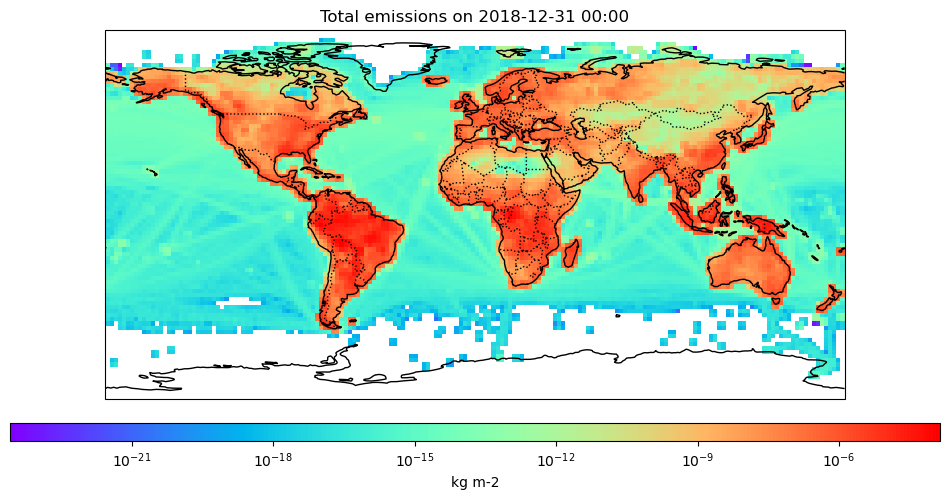

In [21]:
dataset = xr.open_dataset(os.path.join(data_dir,'resample/emissions.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
snapshot(dataset['sum'], time_point, "Total emissions", cmap="rainbow", norm=LogNorm())

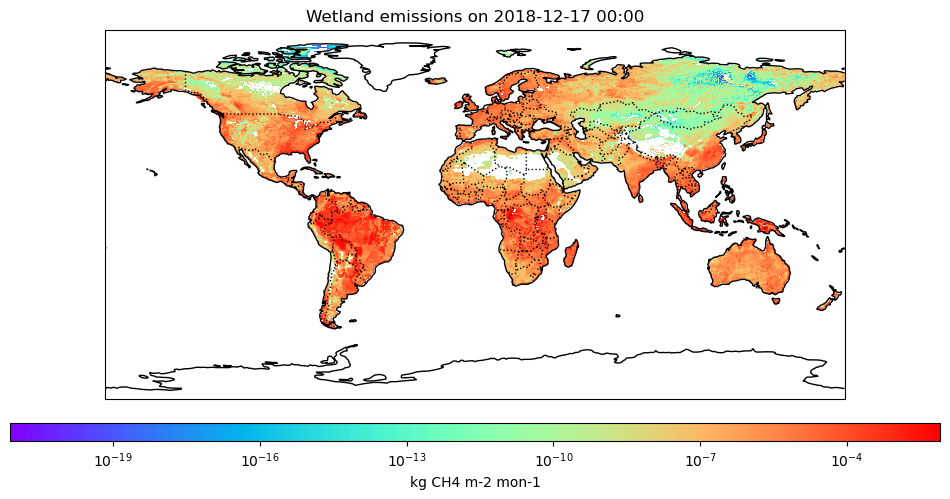

In [24]:
dataset = xr.open_dataset(os.path.join(data_dir,'wetland/NASA_GSFC.ch4_wetlands.v22.x720_y360.t12.2018.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
ani = snapshot(dataset['ch4_wl'], time_point, "Wetland emissions", cmap="rainbow", norm=LogNorm())
# HTML(ani.to_jshtml())

In [ ]:
dataset = xr.open_dataset(os.path.join(data_dir,'anthropogenic/CAMS-GLOB-ANT_Glb_0.1x0.1_anthro_ch4_v5.3_monthly_2018.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
snapshot(dataset['sum'], time_point, "Anthronogenic emissions", cmap="rainbow", norm=LogNorm())

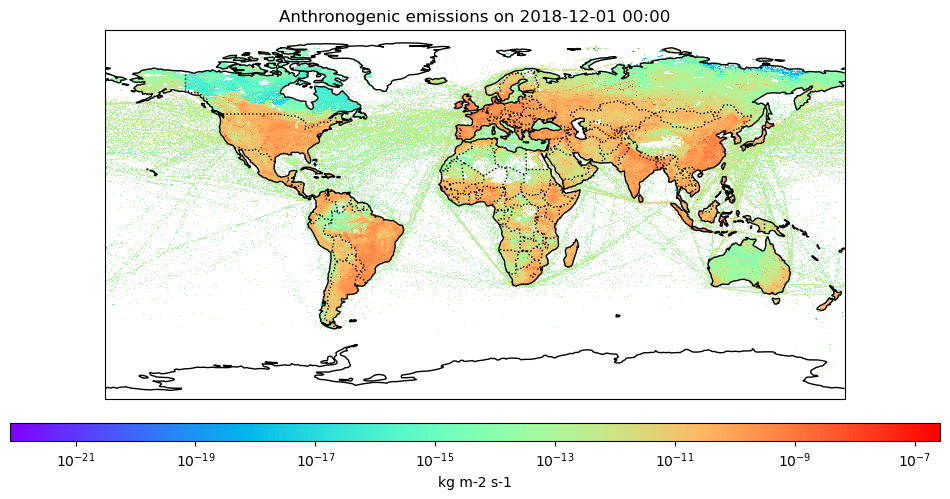

In [64]:
dataset = xr.open_dataset(os.path.join(data_dir,'anthropogenic/CAMS-GLOB-ANT_Glb_0.1x0.1_anthro_ch4_v5.3_monthly_2018.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
snapshot(dataset['sum'], time_point, "Anthronogenic emissions", cmap="rainbow", norm=LogNorm())

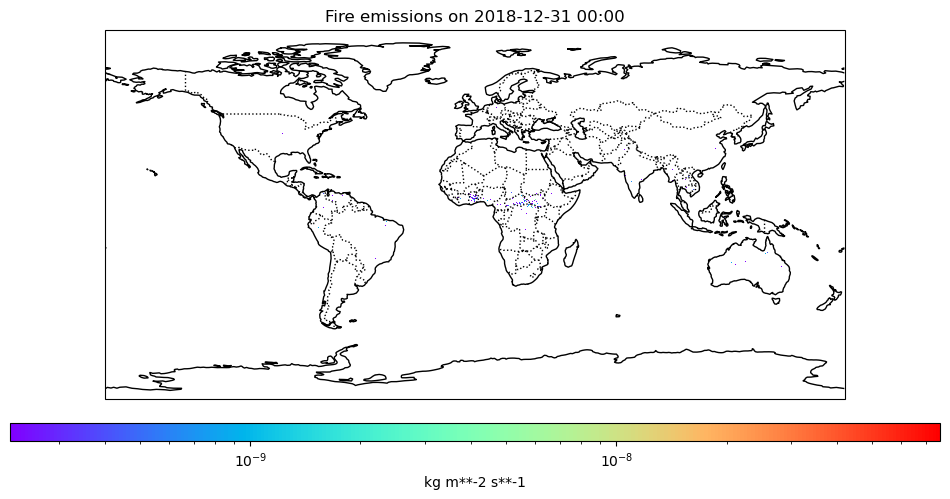

In [17]:
dataset = xr.open_dataset(os.path.join(data_dir,'fire/CAMS_fire_0.1x0.1_2015-2018.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
snapshot(dataset['ch4fire'], time_point, "Fire emissions", cmap="rainbow", norm=LogNorm())

### Meteorology

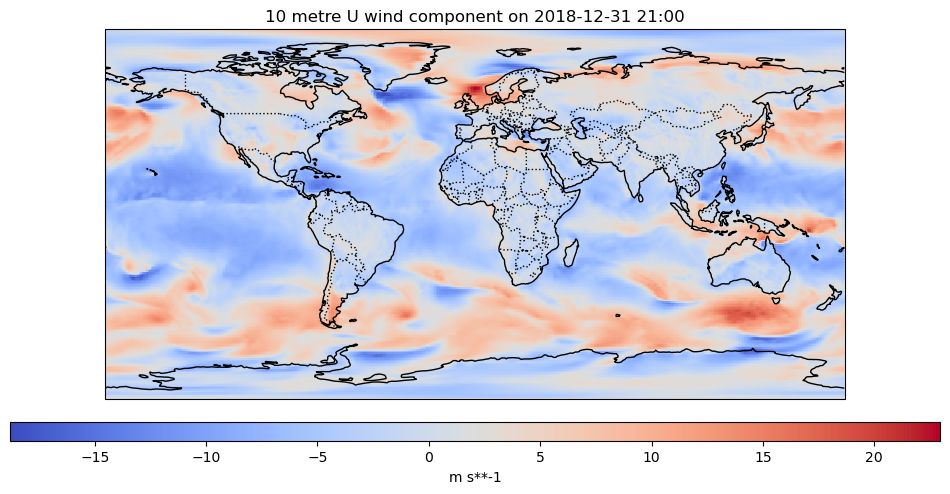

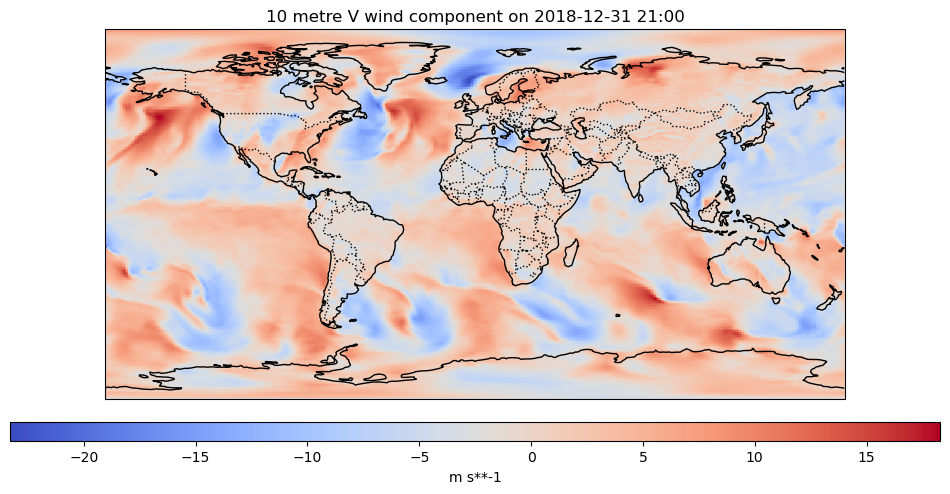

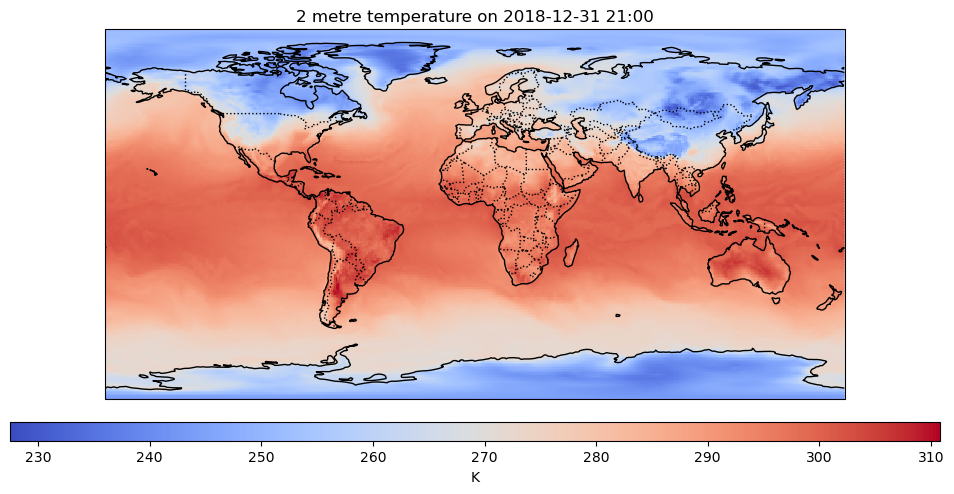

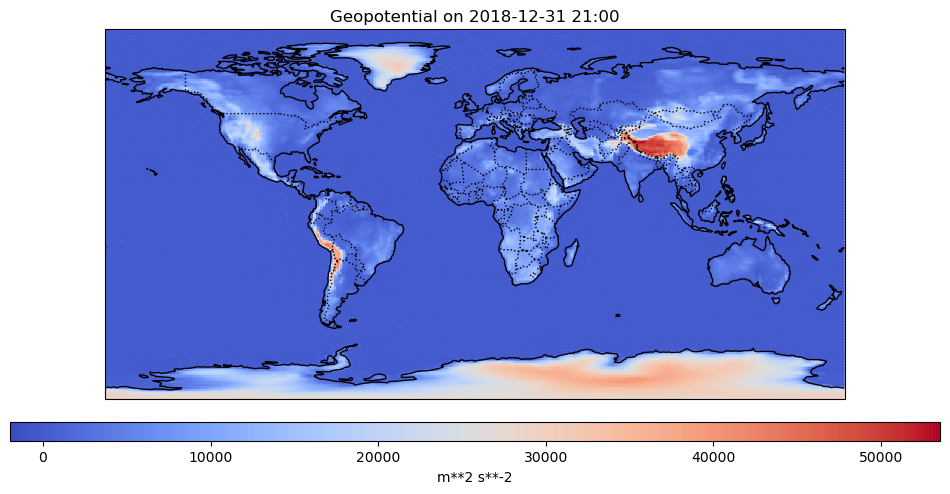

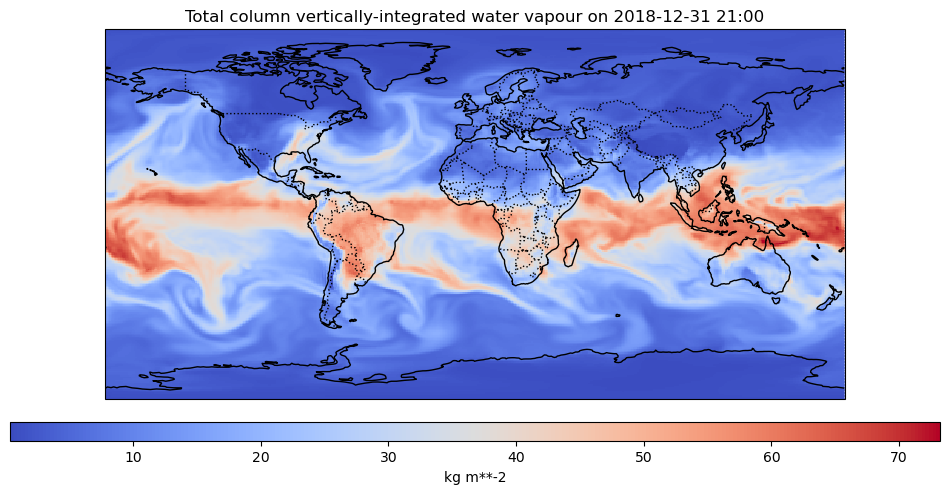

In [60]:
dataset = xr.open_dataset(os.path.join(data_dir,'meteorology/meteorology.nc'))
time_point = dataset['time'][-1]
time_point = pd.to_datetime(time_point.values)
for var in dataset.data_vars:
    snapshot(dataset[var], time_point, f"{dataset[var].long_name}", cmap="coolwarm")